## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---


## 1. calibration using chessboard images

### - import modules

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


In [2]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
#         img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
#         cv2.imshow('img',img)
#         cv2.waitKey(500)

# cv2.destroyAllWindows()

### - Define calibration helper function

In [3]:
def cal_undistort(img, objpoints, imgpoints):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

### - Calibrate chessboard image

True

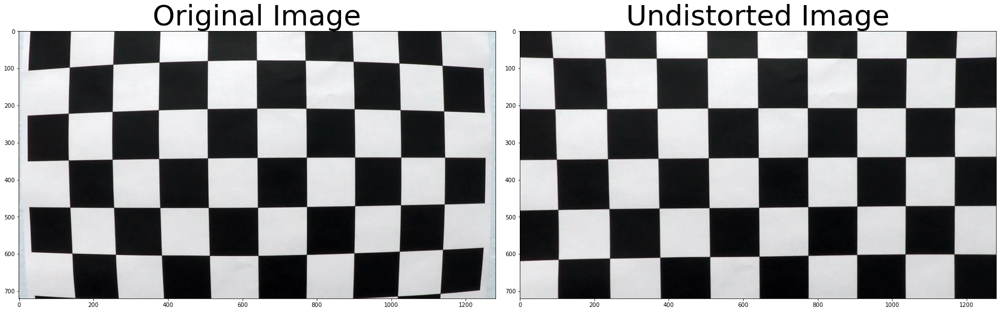

In [4]:
img = cv2.imread(images[0])
undistorted = cal_undistort(img, objpoints, imgpoints)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.) 

cv2.imwrite('output_images/calibrated1.jpg', undistorted)
    
    

## 2. Pipeline using test images

### Step1 : Calibrate test image

In [5]:
images = glob.glob('test_images/*.jpg')

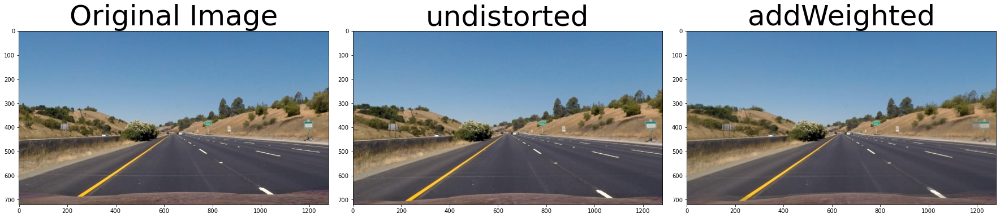

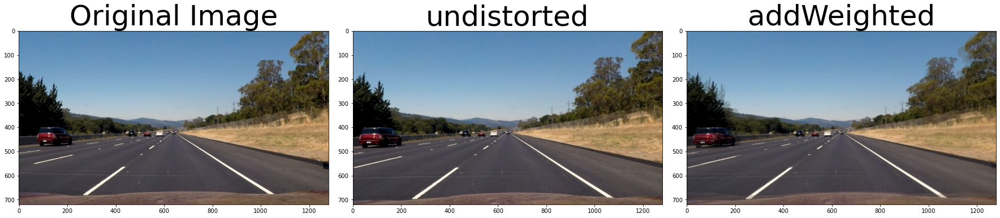

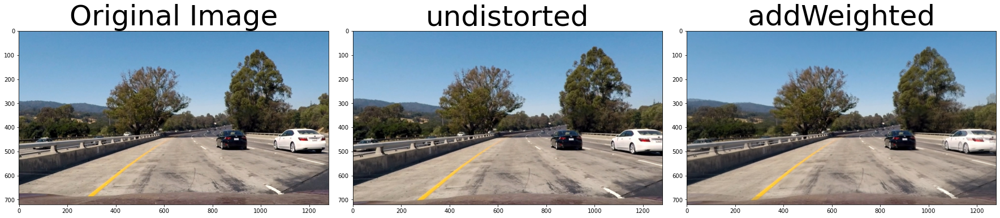

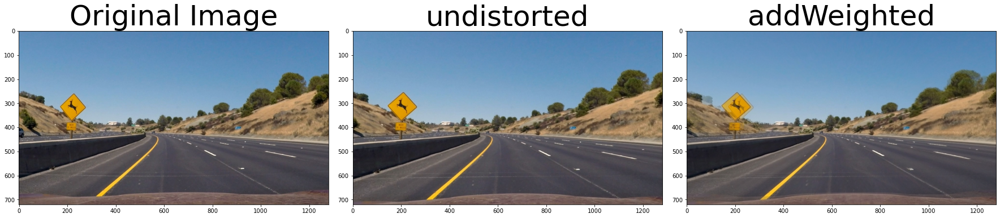

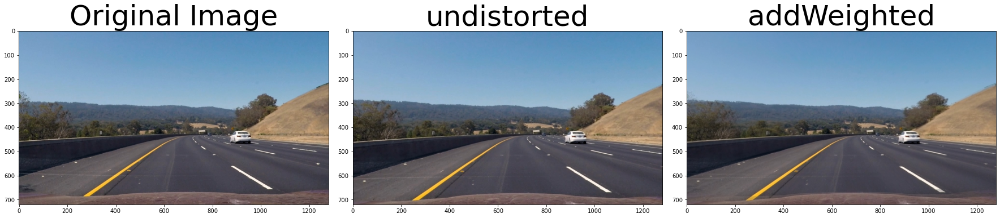

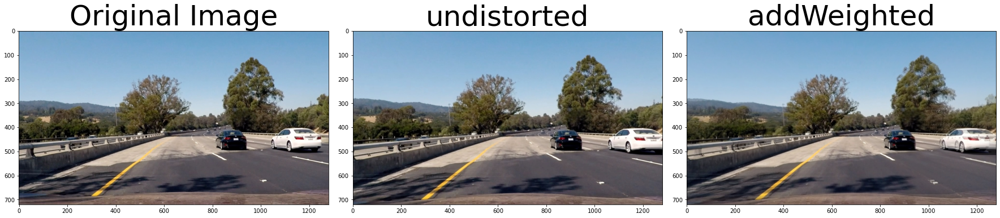

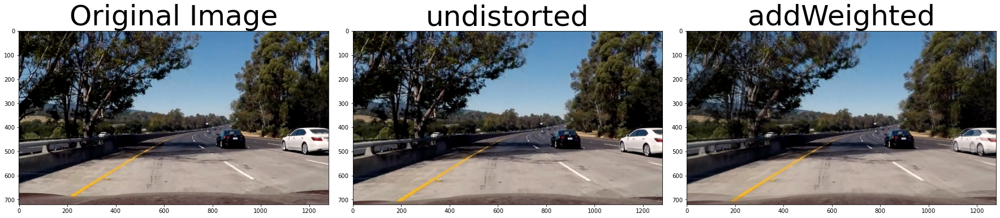

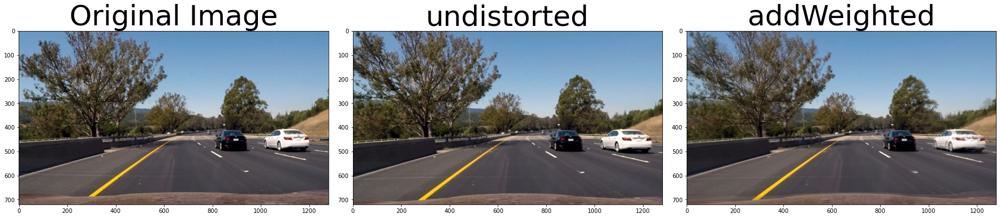

In [6]:
for fname in images:
    # slicing image name
    img_name = fname.split('.')
    img_name = img_name[0].split('\\')
    img_name = img_name[1]
    
    
    img = mpimg.imread(fname)
    undistorted = cal_undistort(img, objpoints, imgpoints)
    img_add = cv2.addWeighted(img, 0.3, undistorted, 0.7, 0)
    
    
    f, (ax1, ax2, ax3) = plt.subplots(nrows = 1, ncols = 3, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(undistorted)
    ax2.set_title('undistorted', fontsize=50)
    ax3.imshow(img_add)
    ax3.set_title('addWeighted', fontsize=50)
    f.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    f.savefig('output_images/'+ img_name + '_step1_cal.jpg')
    
#     cv2.imwrite('output_images/'+ img_name + '_calibrated.jpg', undistorted)
#     cv2.imwrite('output_images/'+ img_name + '_weighted.jpg', img_add)

### Step2 : Binary test image

In [7]:
def abs_sobelx_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):

    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0)
    
    # 3) Take the absolute value of the derivative or gradient
    abs_sobelx = np.absolute(sobelx)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output  = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    return binary_output

def abs_sobely_thresh(img, orient='y', sobel_kernel=3, thresh=(0, 255)):

    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1)
    
    # 3) Take the absolute value of the derivative or gradient
    abs_sobely = np.absolute(sobely)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobely/np.max(sobely))
    
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output  = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    return binary_output

def mag_thresh(img, sobel_kernel=9, mag_thresh=(0, 255)):
    
   # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0, ksize=sobel_kernel)
    sobely= cv2.Sobel(gray,cv2.CV_64F,0,1, ksize=sobel_kernel)
    
    # 3) Take the absolute value of the derivative or gradient
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    gradmag = np.uint8(255*gradmag/np.max(gradmag))
    
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output  = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & ( gradmag<= mag_thresh[1])] = 1
    
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    return binary_output

def hls_select(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    
    # 2) Apply a threshold to the S channel
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    
    # 3) Return a binary image of threshold result
    
    return binary_output


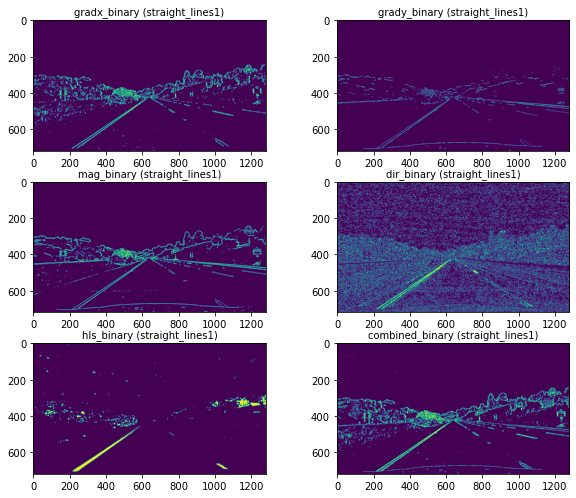

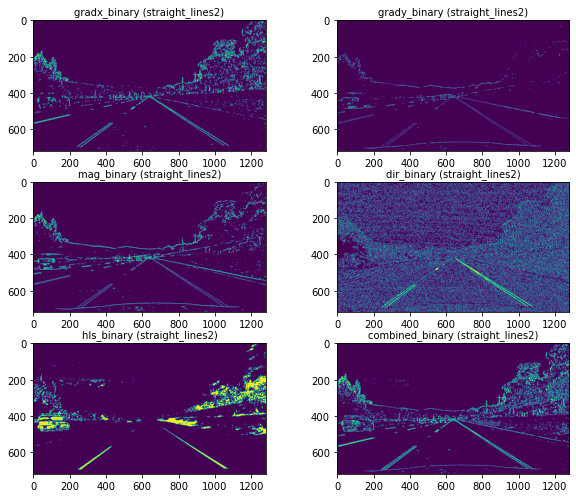

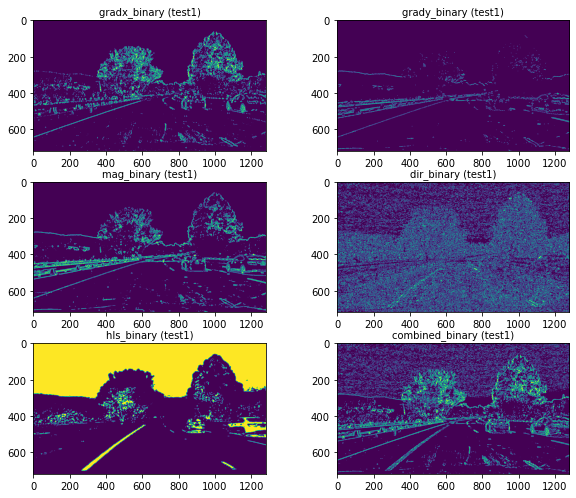

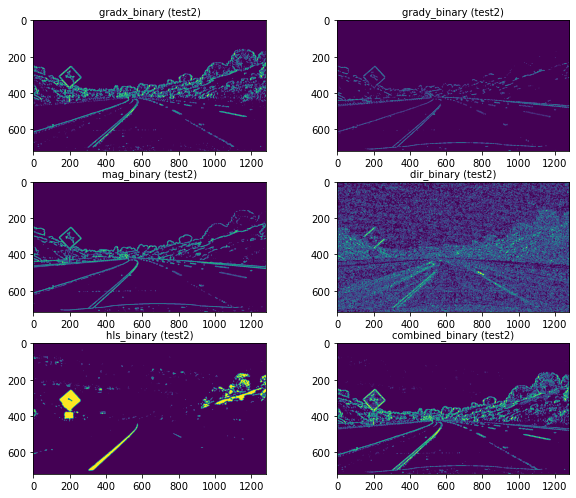

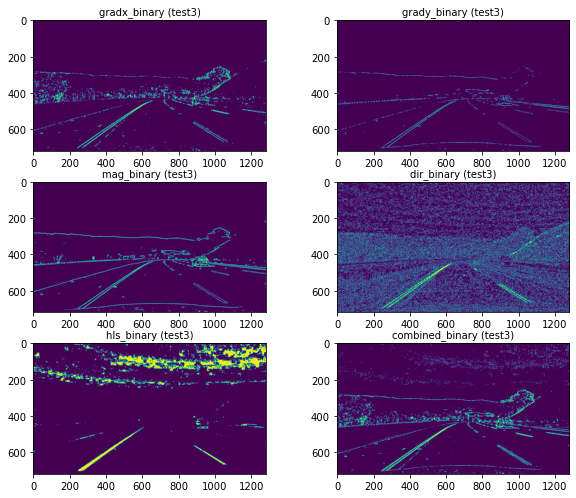

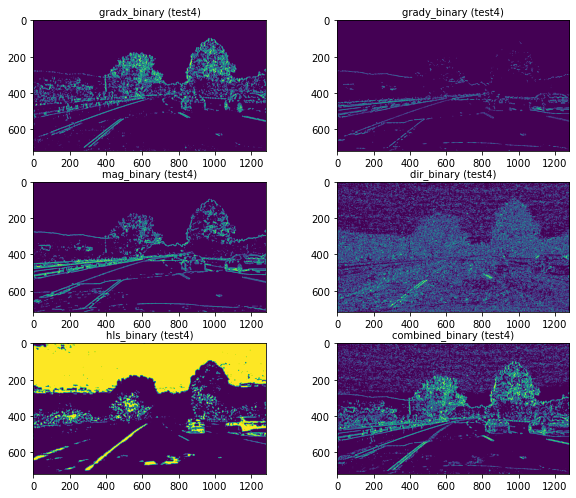

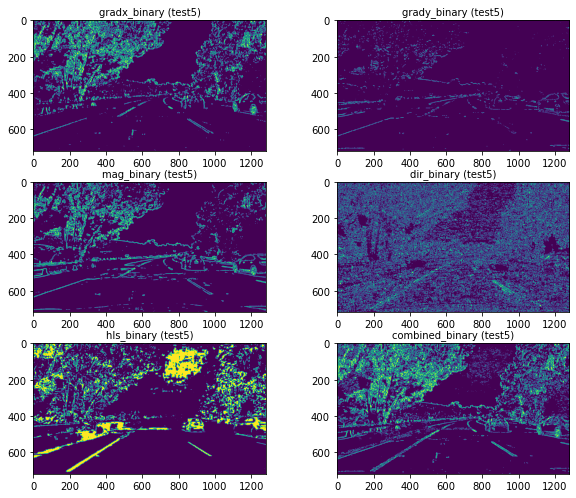

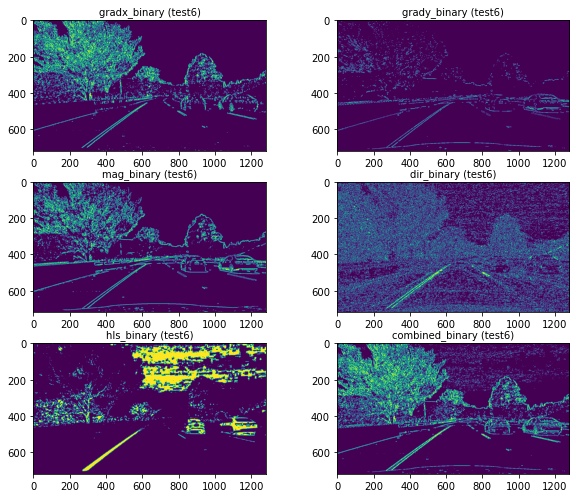

In [8]:
ksize = 3
for fname in images:
    # 0. slicing image name
    img_name = fname.split('.')
    img_name = img_name[0].split('\\')
    img_name = img_name[1]

    img = mpimg.imread(fname)
    
    # 1. calibration image
    undistorted = cal_undistort(img, objpoints, imgpoints)
    
    # 2. make binary image using grad or color tranform ...
    gradx_binary = abs_sobelx_thresh(undistorted, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    grady_binary = abs_sobely_thresh(undistorted, orient='y', sobel_kernel=ksize, thresh=(60, 100))
    mag_binary = mag_thresh(undistorted, sobel_kernel=ksize, mag_thresh=(40, 120))
    dir_binary = dir_threshold(undistorted, sobel_kernel=ksize, thresh=(0.8, 1.2))
    hls_binary = hls_select(undistorted, thresh=(110, 255))
    
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[((gradx_binary == 1) | (grady_binary== 1) & (mag_binary == 1)) |
                    ((hls_binary == 1) & (dir_binary == 1))]= 1
    
    f, ((ax1, ax2),(ax3, ax4),(ax5, ax6)) = plt.subplots(nrows = 3, ncols = 2, figsize=(10, 9))
    
    ax1.imshow(gradx_binary)
    ax1.set_title('gradx_binary '+'('+ img_name +')', fontsize=10)
    ax2.imshow(grady_binary)
    ax2.set_title('grady_binary '+'('+ img_name +')', fontsize=10)
    ax3.imshow(mag_binary)
    ax3.set_title('mag_binary '+'('+ img_name +')', fontsize=10)
    ax4.imshow(dir_binary)
    ax4.set_title('dir_binary '+'('+ img_name +')', fontsize=10)
    ax5.imshow(hls_binary)
    ax5.set_title('hls_binary '+'('+ img_name +')', fontsize=10)
    ax6.imshow(combined_binary)
    ax6.set_title('combined_binary '+'('+ img_name +')', fontsize=10)
    f.tight_layout()
    f.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.2)
    f.savefig('output_images/'+ img_name + '_step2_binary.jpg')
    

### Step3 : Warp and Hist test image

In [9]:
def warp_image(img, src, dst):
    img_size = (img.shape[1], img.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size)
    return warped, M

def hist(img):
    bottom_half = img[img.shape[0]*2//3:,:]
#     print(f'bottom_half : {img.shape}')
    histogram = np.sum(bottom_half, axis=0)
    
    return histogram

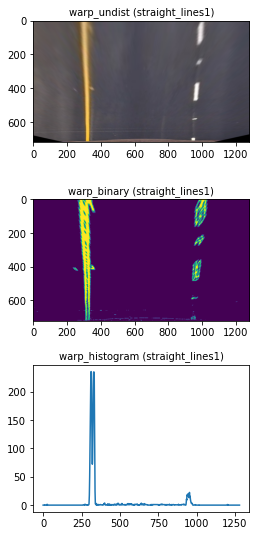

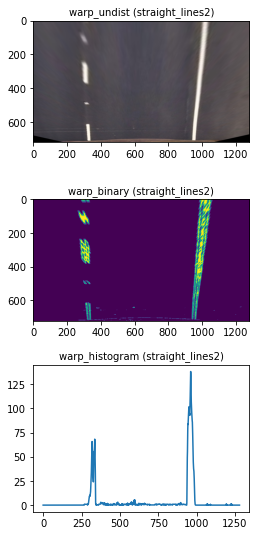

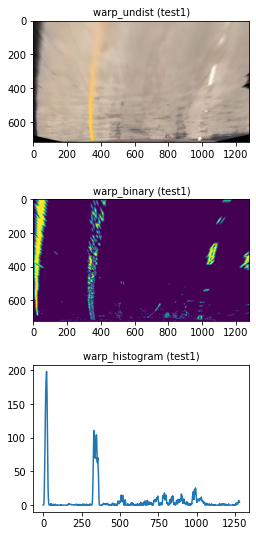

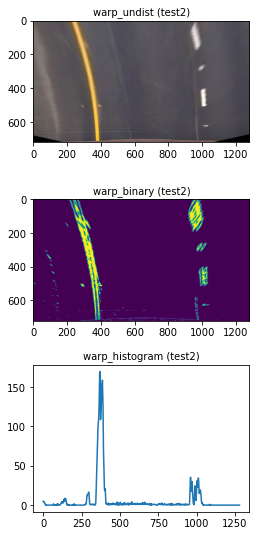

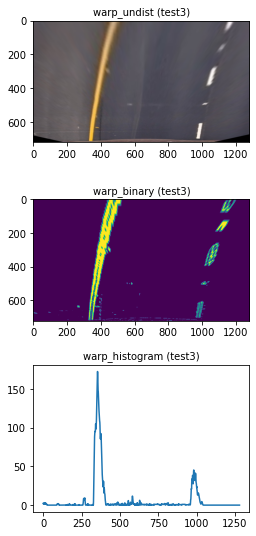

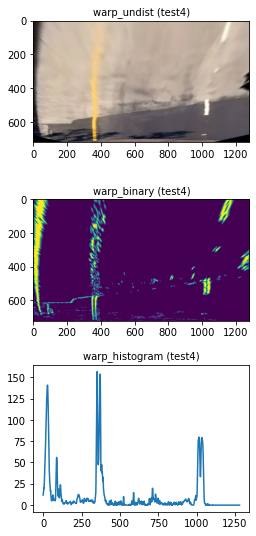

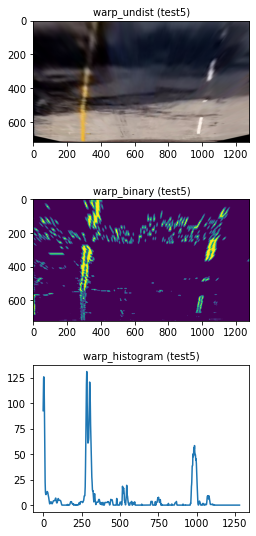

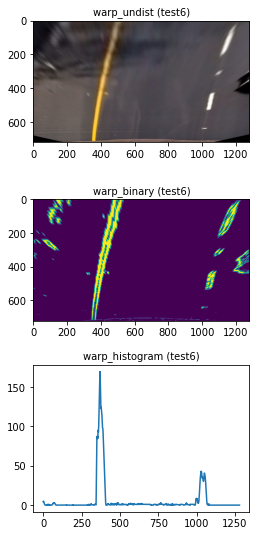

In [10]:

for fname in images:
    # 0. slicing image name
    img_name = fname.split('.')
    img_name = img_name[0].split('\\')
    img_name = img_name[1]

    img = mpimg.imread(fname)
    
    # 1. calibration image
    undistorted = cal_undistort(img, objpoints, imgpoints)
    
    # 2. make binary image using grad or color tranform ...
    gradx_binary = abs_sobelx_thresh(undistorted, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    grady_binary = abs_sobely_thresh(undistorted, orient='y', sobel_kernel=ksize, thresh=(60, 100))
    mag_binary = mag_thresh(undistorted, sobel_kernel=ksize, mag_thresh=(40, 120))
    dir_binary = dir_threshold(undistorted, sobel_kernel=ksize, thresh=(0.8, 1.2))
    hls_binary = hls_select(undistorted, thresh=(110, 255))
    
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[((gradx_binary == 1) | (grady_binary== 1) & (mag_binary == 1)) |
                    ((hls_binary == 1) & (dir_binary == 1))]= 1
    
    
    # 3. make top-down (birds-eye) view 
    img_size = (undistorted.shape[1], undistorted.shape[0])
#     print(f'img_size : {img_size}')
    src = np.float32(
        [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
        [((img_size[0] / 6) - 10), img_size[1]],
        [(img_size[0] * 5 / 6) + 60, img_size[1]],
        [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])
    
#     print(f'src : {src}')
#     print(f'dst : {dst}')
    warp_undist, M_undist  = warp_image(undistorted, src, dst)
    warp_binary, M_binary  = warp_image(combined_binary, src, dst)
    
    # 4. create histogram using binary image
    warp_histogram = hist(warp_binary)
    
    f, ((ax1), (ax2), (ax3)) = plt.subplots(nrows = 3, ncols = 1, figsize=(10, 10))
    
    ax1.imshow(warp_undist)
    ax1.set_title('warp_undist '+'('+ img_name +')', fontsize=10)
    ax2.imshow(warp_binary)
    ax2.set_title('warp_binary '+'('+ img_name +')', fontsize=10)
    ax3.plot(warp_histogram)
    ax3.set_title('warp_histogram '+'('+ img_name +')', fontsize=10)
    
    f.tight_layout()
    f.subplots_adjust(left=0.35, right=0.65, top=0.9, bottom=0.2)
    f.savefig('output_images/'+ img_name + '_step3_warp & hist.jpg')

### Step4 : Line fitting test image

In [11]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):
    ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty,leftx,2)
    right_fit = np.polyfit(righty,rightx,2)
    
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[2] + left_fit[1]*ploty + left_fit[0]*ploty**2
    right_fitx = right_fit[2] + right_fit[1]*ploty + right_fit[0]*ploty**2
    
    return left_fit, right_fit, left_fitx, right_fitx, ploty

def search_around_poly(binary_warped, margin, left_line_index, right_line_index):
    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    
    left_lane_inds = ((nonzerox >  left_line_index- margin) & (nonzerox < (left_line_index + margin)))
    right_lane_inds = ((nonzerox > right_line_index -margin) & (nonzerox < (right_line_index + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
  
    return leftx, lefty, rightx, righty

def measure_curvature_real(left_fitx, right_fitx, ploty, xm_per_pix, ym_per_pix):
    left_fitx = left_fitx[::-1]
    right_fitx = right_fitx[::-1]
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    
#     print(f'left_fit_cr : {left_fit_cr}')
#     print(f'right_fit_cr : {right_fit_cr}')
    
    # Calculation of R_curve (radius of curvature)
    y_eval = np.max(ploty)
    left_curverad = ((1 + (left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    if left_fit_cr[0] > 0:
        left_curverad = left_curverad
    else:
        left_curverad = -left_curverad
        
    if right_fit_cr[0] > 0:
        right_curverad = right_curverad
    else:
        right_curverad = -right_curverad
    
    left_head  = left_fit_cr[1]
    right_head  = right_fit_cr[1]
    
    left_offset  = left_fit_cr[2]
    right_offset  = right_fit_cr[2]
    
    return left_curverad, right_curverad, left_head, right_head,left_offset,right_offset

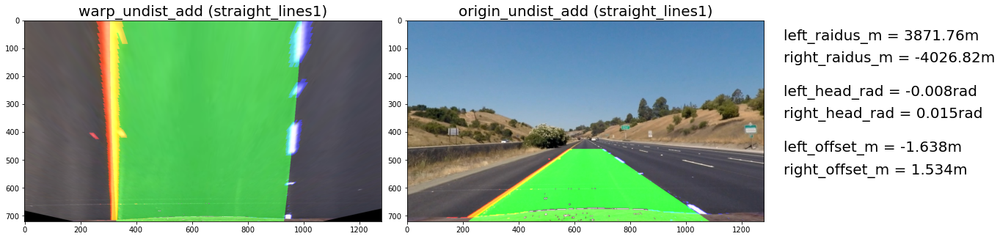

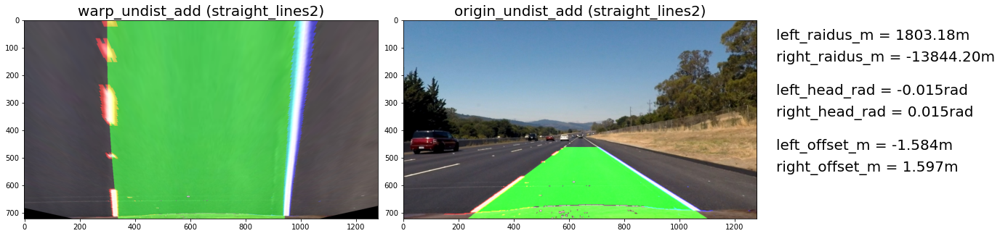

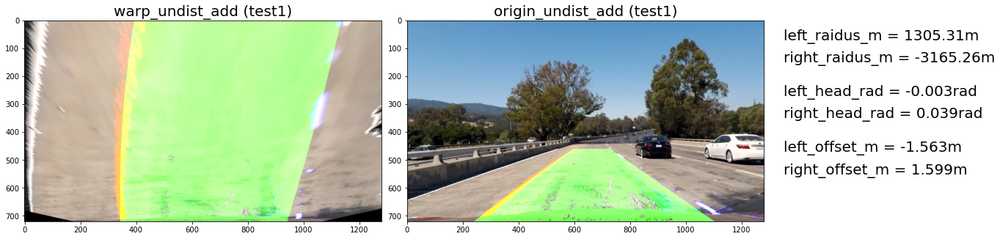

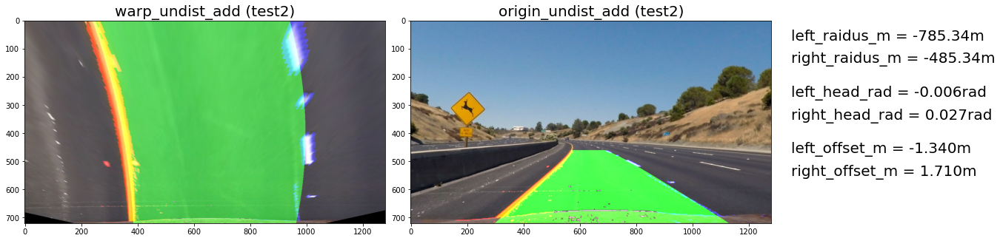

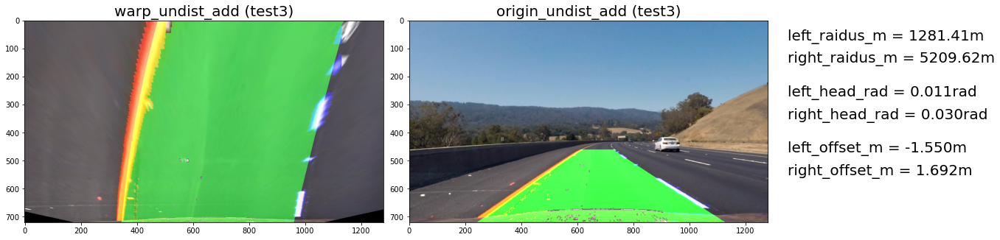

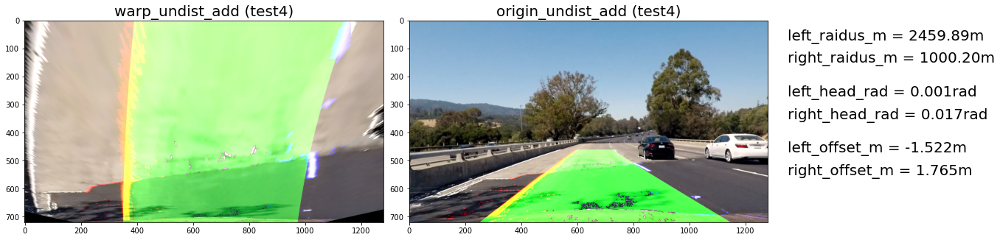

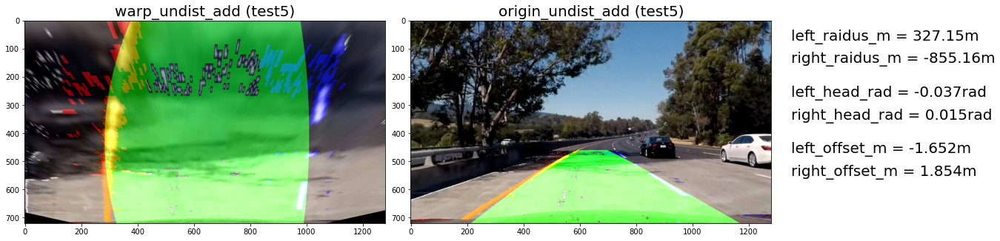

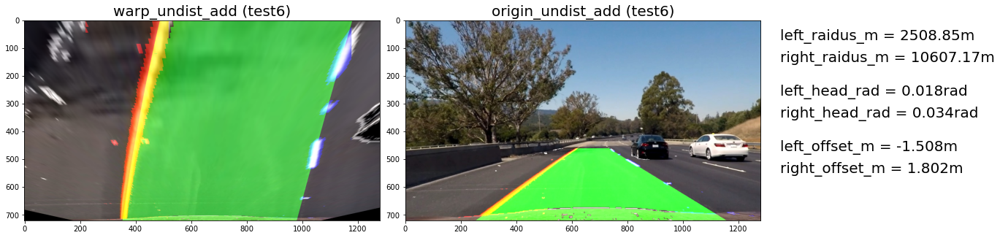

In [12]:
for fname in images:
    # 0. slicing image name
    img_name = fname.split('.')
    img_name = img_name[0].split('\\')
    img_name = img_name[1]

    img = mpimg.imread(fname)
    
    # 1. calibration image
    undistorted = cal_undistort(img, objpoints, imgpoints)
    
    # 2. make binary image using grad or color tranform ...
    gradx_binary = abs_sobelx_thresh(undistorted, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    grady_binary = abs_sobely_thresh(undistorted, orient='y', sobel_kernel=ksize, thresh=(60, 100))
    mag_binary = mag_thresh(undistorted, sobel_kernel=ksize, mag_thresh=(40, 120))
    dir_binary = dir_threshold(undistorted, sobel_kernel=ksize, thresh=(0.8, 1.2))
    hls_binary = hls_select(undistorted, thresh=(110, 255))
    
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[((gradx_binary == 1) | (grady_binary== 1) & (mag_binary == 1)) |
                    ((hls_binary == 1) & (dir_binary == 1))]= 1
    
    
    # 3. make top-down (birds-eye) view 
    img_size = (undistorted.shape[1], undistorted.shape[0])

    src = np.float32(
        [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
        [((img_size[0] / 6) - 10), img_size[1]],
        [(img_size[0] * 5 / 6) + 60, img_size[1]],
        [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])
    

    warp_undist, M_undist  = warp_image(undistorted, src, dst)
    warp_binary, M_binary  = warp_image(combined_binary, src, dst)
    
    
    # 4. create histogram using binary image
    warp_histogram = hist(warp_binary)

    
    # 5. finding polynomial fitting component of the lane
    margin = 150
    warp_hist_left_bound = warp_histogram[img_size[0]//2 - 500 : img_size[0]//2]
    warp_hist_right_bound = warp_histogram[img_size[0]//2 : img_size[0]//2 + 500]
    left_line_index = img_size[0]//2 - 500 + np.argmax(warp_hist_left_bound)
    right_line_index = img_size[0]//2 + np.argmax(warp_hist_right_bound)

    leftx, lefty, rightx, righty = search_around_poly(warp_binary, margin, left_line_index, right_line_index)

    
    
    # 6. Fit new polynomials based on image
    left_fit, right_fit, left_fitx, right_fitx, ploty = fit_poly(warp_binary.shape, leftx, lefty, rightx, righty)
      
    

   
    # 7. Fit new polynomials based on real world
    # left (-x), right(+x), forward (+y), backward (-y)
    # x = offset_m + head_rad*y + 1/(2*radius_m)**y (if head is small assumption)
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    left_fitx_real = left_fitx - img_size[0]//2
    right_fitx_real = right_fitx - img_size[0]//2
    left_raidus_m, right_raidus_m, left_head_rad, right_head_rad, left_offset_m, right_offset_m = measure_curvature_real(left_fitx_real, right_fitx_real, ploty, xm_per_pix, ym_per_pix)
#     print(f'left_raidus_m = {left_raidus_m}')
#     print(f'right_raidus_m = {right_raidus_m}')
#     print(f'left_head_rad = {left_head_rad}')
#     print(f'right_head_rad = {right_head_rad}')
#     print(f'left_offset_m = {left_offset_m}')
#     print(f'right_offset_m = {right_offset_m}')



    # 8. Add line polynomials on the original imag
    out_img = np.dstack((warp_binary, warp_binary, warp_binary))*255
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
    mask = np.zeros_like(out_img)
    left_area = np.vstack((left_fitx.astype(np.int32),ploty.astype(np.int32))).T
    right_area = np.vstack((right_fitx.astype(np.int32),ploty.astype(np.int32))).T
    area_point = np.vstack((left_area,right_area[::-1]))
    area = cv2.fillPoly(mask,[area_point],[0, 255, 0])
    warp_binary_add = cv2.addWeighted(area, 1, out_img, 1, 0)
    warp_undist_add = cv2.addWeighted(warp_binary_add.astype(np.uint8), 0.5, warp_undist, 1, 0)
    
    origin_binary_add, M_binary  = warp_image(warp_binary_add, dst, src)
    origin_undist_add = cv2.addWeighted(origin_binary_add.astype(np.uint8), 0.8, undistorted, 1, 0)
    

    
    
    f, ((ax1, ax2)) = plt.subplots(nrows = 1, ncols = 2, figsize=(20, 14))
    ax1.imshow(warp_undist_add)
    ax1.set_title('warp_undist_add '+'('+ img_name +')', fontsize=20)
    ax2.imshow(origin_undist_add)   
    ax2.set_title('origin_undist_add '+'('+ img_name +')', fontsize=20)
    ax2.text(1350,70,f'left_raidus_m = {left_raidus_m:0.2f}m', fontsize=20)
    ax2.text(1350,150,f'right_raidus_m = {right_raidus_m:0.2f}m', fontsize=20)
    ax2.text(1350,270,f'left_head_rad = {left_head_rad:0.3f}rad', fontsize=20)
    ax2.text(1350,350,f'right_head_rad = {right_head_rad:0.3f}rad', fontsize=20)
    ax2.text(1350,470,f'left_offset_m = {left_offset_m:0.3f}m', fontsize=20)
    ax2.text(1350,550,f'right_offset_m = {right_offset_m:0.3f}m', fontsize=20)
    f.tight_layout()
    f.subplots_adjust(left=0.05, right=0.75, top=0.9, bottom=0.2)
    f.savefig('output_images/'+ img_name + '_step4_linefit.jpg')
    